# **Landsat WOFS-derived Annual Water Masks**

Generate annual summary that can be used as a training mask for refinement of per-scene water classification

Used to create Annual Water Summary Products from the per-scene water masks that were generated by implementing the WOFS classifier upon all Landsat-# scenes. This was treated as a non-ODC data preparation step and therefore the original example implementation can be found within ard-workflows and the docker reqs within ard-docker-images


In [1]:
# !pip install git+https://github.com/SatelliteApplicationsCatapult/datacube-utilities.git#egg=datacube_utilities

need bespoke roi module

In [11]:
# Magic + imports likely common across all notebooks
%load_ext autoreload
%autoreload 2
%matplotlib inline
# Supress Warning 
import warnings
warnings.filterwarnings('ignore')

# Generic python
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import LogFormatter 

import numpy as np
import xarray as xr 
from datetime import datetime
from datetime import timedelta
import pandas as pd
import geopandas as gpd
from shapely import wkt
import rasterio
import rasterio.features
import salem
import os
import gc
from subprocess import Popen, PIPE, STDOUT
import shutil
import glob
from dateutil.parser import parse
import uuid
from tqdm import tqdm
import gc

# ml stuff
from sklearn.ensemble import RandomForestClassifier

# sac utils-specific
from datacube_utilities.createAOI import create_lat_lon
from datacube_utilities.import_export import export_xarray_to_geotiff
import datacube_utilities.data_access_api as dc_api

# dc-specific
from datacube import Datacube
from datacube.storage.masking import mask_invalid_data
dc = Datacube()
api = dc_api.DataAccessApi()

# dask stuff
import dask.array
import dask
from dask.distributed import Client
client = Client('dask-scheduler.dask.svc.cluster.local:8786')
client

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Client Scheduler: tcp://dask-scheduler.dask.svc.cluster.local:8786 Dashboard: http://dask-scheduler.dask.svc.cluster.local:8787/status,Cluster Workers: 5 Cores: 15 Memory: 100.00 GB


In [2]:
# to be fixed when needed (i.e. prepping outputs -- should this code be folded into SAC main datacube_utilities package?)
import sys
sys.path.append('/home/jovyan/odc-hub/')

#from ard_workflows.utils.prep_utils import s3_list_objects, s3_download, s3_upload_cogs, create_yaml, cog_translate, get_geometry
from dataset_index_from_s3_bucket import main as ind

# **VAR - AoI**
- Minimum AoI used to test (a) export + indexing (b) creation of per-scene ML products (the below seems representative (balance water/non-water) intersection of S2 tile 60XF and Landsat tile 74_72)
- annual water summary products need to be generated in a scalable manner (aligned with tiling of geomedian-creation(?)) and both archive processing + routine processing in a way that enables both the highest quality final Summary Products (i.e. inc. per-scene classification for all sensors) and enables the implementaiton of the per-scene classifications. How to do this most appropriately is TBD.

define aoi as wkt and create gdf

In [3]:
suva = "POLYGON((178.3567599373829 -18.02896483111522,178.59124937830086 -18.02896483111522,178.59124937830086 -18.22245219092141,178.3567599373829 -18.22245219092141,178.3567599373829 -18.02896483111522))"
overall_aoi_wkt = suva
overall_aoi_gdf = pd.DataFrame({'geometry':[overall_aoi_wkt]})
overall_aoi_gdf['geometry'] = overall_aoi_gdf['geometry'].apply(wkt.loads)
overall_aoi_gdf['aoi'] = 'aoi'
overall_aoi_gdf = gpd.GeoDataFrame(overall_aoi_gdf, geometry='geometry', crs={"init": "epsg:4326"}) # using {init} important
latitude, longitude = create_lat_lon(overall_aoi_wkt)

latitude, longitude

((-18.22245219092141, -18.02896483111522),
 (178.3567599373829, 178.59124937830086))

plot aoi world borders for context

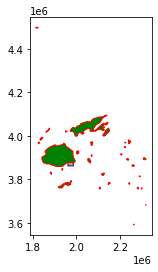

In [4]:
world = gpd.read_file('/home/jovyan/TM_WORLD_BORDERS.geojson') # load world borders
world = world[world['NAME'] == 'Fiji'] # don't care about antarctica...
world = world[['NAME','geometry']].to_crs({"init": "epsg:3460"}) # keep just cols to join/merge

fig, ax = plt.subplots()
overall_aoi_gdf.to_crs({"init": "epsg:3460"}).plot(facecolor="y",edgecolor="b", ax=ax);
world.to_crs({"init": "epsg:3460"}).plot(facecolor="g",edgecolor="r", ax=ax);

In [5]:
print('f')

f


# **Funcs**

In [6]:
def load_water_ds(products, t_bin, latitude, longitude, output_crs, measurements, scen):

    product_data = []
    for product in products:
        ds = dc.load(
            product=product,
            time=t_bin, 
            lat=latitude,
            lon=longitude,
            output_crs=output_crs,
            resolution=resolution,
            measurements = measurements,
            group_by='solar_day',
            dask_chunks={
                'time': 1,
                'x': 2202,            
                'y': 2416,
            }
        )
        if ds != None:
            if (scen == "WaterPersistence") | (scen == None):
                good_quality = (
                (ds.watermask >= 0) # no data
                )
            elif scen == "WaterPersistence95conf":                
                good_quality = (
                (ds.watermask >= 0) & # no data
                (
                    (ds.waterprob <= 5) |
                    (ds.waterprob >= 95)
                ) # predictions with >95% confidence
                )
            ds = ds.where(good_quality)
            product_data.append(ds)
    water_dataset = xr.concat(product_data, dim='time').sortby('time')
    print(f"EST GB: {water_dataset.nbytes/1000000000}\nDS: {water_dataset}")
    
    return water_dataset

lazy computation

In [7]:
def wfls(water_dataset):

    mean_dataset = water_dataset.watermask.mean(dim='time')
    print(f"MEAN GB: {mean_dataset.nbytes/1000000000}")
    
    ## Prepare water pc
    T0_nd_water = np.isnan(mean_dataset) # nodata mask
    water_pc = (mean_dataset*100).where((T0_nd_water == False),-9999) # assign nodata vals consistent w/ other prods
    water_pc = water_pc.astype(np.int16) # seems most sensible
    
    ## Prepare water_no
    cnt = water_dataset.watermask.count(dim='time')
#     print(cnt.nbytes/1000000000)
    water_no = cnt.astype(np.int16) # seems most sensible
    
    ## Prepare water mask
    waterpres_prob = 0.5
    T0_nd_water = np.isnan(mean_dataset)
    T0_water = mean_dataset.where((mean_dataset < waterpres_prob) | (T0_nd_water == True), 1) # fix > prob to water
    T0_water = T0_water.where((T0_water >= waterpres_prob) | (T0_nd_water == True), 0) # fix < prob to no water
    
    ## Compute water_pc and water_no at the same time.
    ## Also compute intermediaries for plotting.
    water_pc_comp, water_no_comp, T0_water_comp = dask.compute(water_pc, water_no, T0_water)
    
    water_dataset = None
    
    return(water_pc_comp, water_no_comp, T0_water_comp)
    

In [8]:
def plts(persistence, num, mask, aoi_lab, t_lab, s_lab, sum_lab, wd):
    
    fig, ax = plt.subplots(figsize=(20,20))
    im1 = ax.imshow(persistence.where(persistence!=-9999), cmap=matplotlib.cm.get_cmap('brg_r'))
    im1.set_clim(0,100)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im1, cax=cax, ax=ax)
    ax.set_title(f'{aoi_lab}_{t_lab}_{s_lab}_{sum_lab}')
#     fig.show()
    fig.savefig(f'{wd}{aoi_lab}_{t_lab}_{s_lab}_{sum_lab}.jpeg', bbox_inches='tight', pad_inches=0)
    fig, ax, cax, im1 = None, None, None, None
    
    
    fig, ax = plt.subplots(figsize=(20,20))
#     im1 = ax.imshow(num, cmap=matplotlib.cm.get_cmap('YlGn'),norm=matplotlib.colors.LogNorm())
    im1 = ax.imshow(num, cmap=matplotlib.cm.get_cmap('viridis'),norm=matplotlib.colors.LogNorm())
    im1.set_clim(1,125)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    formatter = LogFormatter(10, labelOnlyBase=False) 
    cbar = plt.colorbar(im1, cax=cax, ax=ax, ticks=[1,5,10,20,50,80,120], format=formatter)
    cbar.ax.set_yticklabels(['1','5','10','20','50','80','120'])
    ax.set_title(f'{aoi_lab}_{t_lab}_{s_lab}_{sum_lab}_obnum')
#     fig.show()
    fig.savefig(f'{wd}{aoi_lab}_{t_lab}_{s_lab}_{sum_lab}_obnum.jpeg', bbox_inches='tight', pad_inches=0)
    fig, ax, cax, im1 = None, None, None, None

# **VARS & Iterables**

In [9]:
print('boo')

boo



 

LANDSAT_ETM
('2019-01-01', '2019-12-31') 2019
must supply at least one object to concatenate
EST GB: 1.962511312
DS: <xarray.Dataset>
Dimensions:    (time: 23, x: 2485, y: 2146)
Coordinates:
  * x          (x) float64 1.958e+06 1.958e+06 1.958e+06 ... 1.983e+06 1.983e+06
  * y          (y) float64 3.886e+06 3.886e+06 3.886e+06 ... 3.865e+06 3.865e+06
  * time       (time) datetime64[ns] 2001-01-03T21:57:25 ... 2001-11-28T21:49:00
Data variables:
    watermask  (time, y, x) float64 dask.array<chunksize=(1, 2146, 2202), meta=np.ndarray>
    waterprob  (time, y, x) float64 dask.array<chunksize=(1, 2146, 2202), meta=np.ndarray>
Attributes:
    crs:      EPSG:3460
MEAN GB: 0.04266248


 

LANDSAT_ETM
('2019-01-01', '2019-12-31') 2019
must supply at least one object to concatenate
EST GB: 1.962511312
DS: <xarray.Dataset>
Dimensions:    (time: 23, x: 2485, y: 2146)
Coordinates:
  * x          (x) float64 1.958e+06 1.958e+06 1.958e+06 ... 1.983e+06 1.983e+06
  * y          (y) float64 3.88

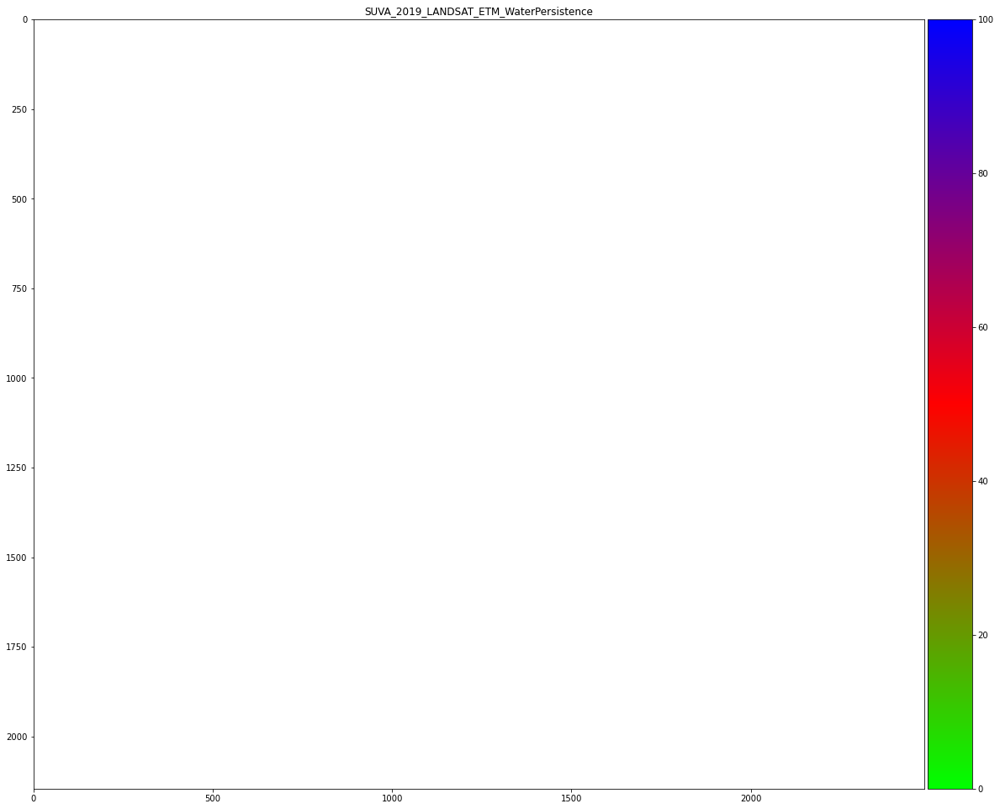

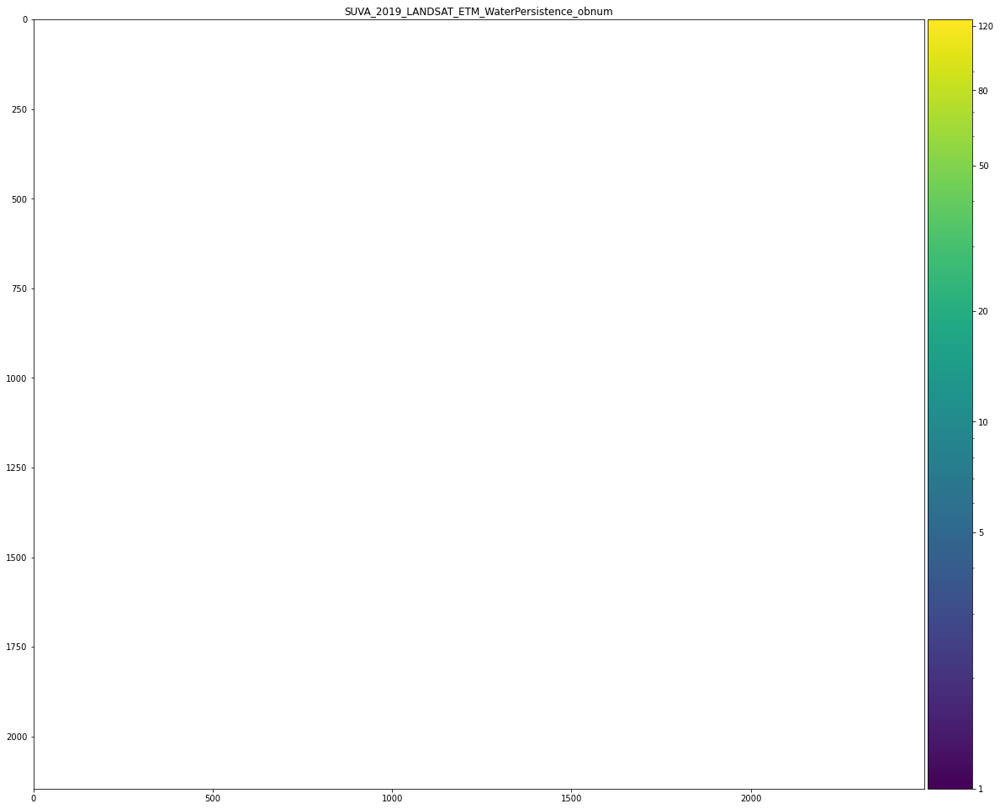

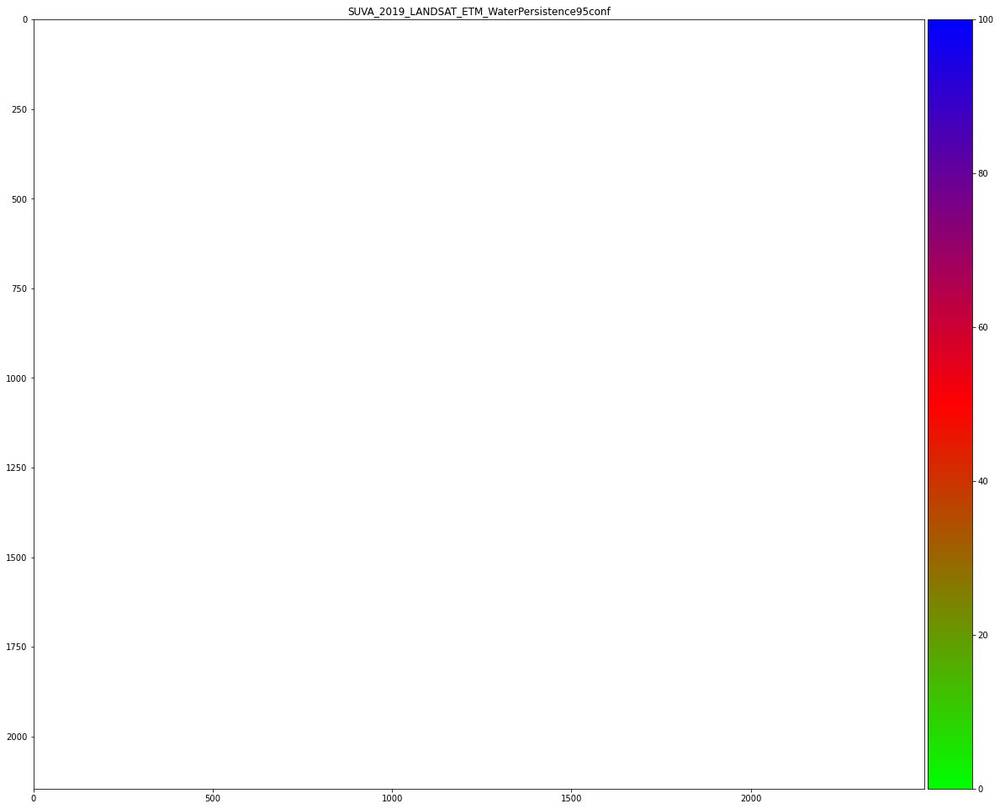

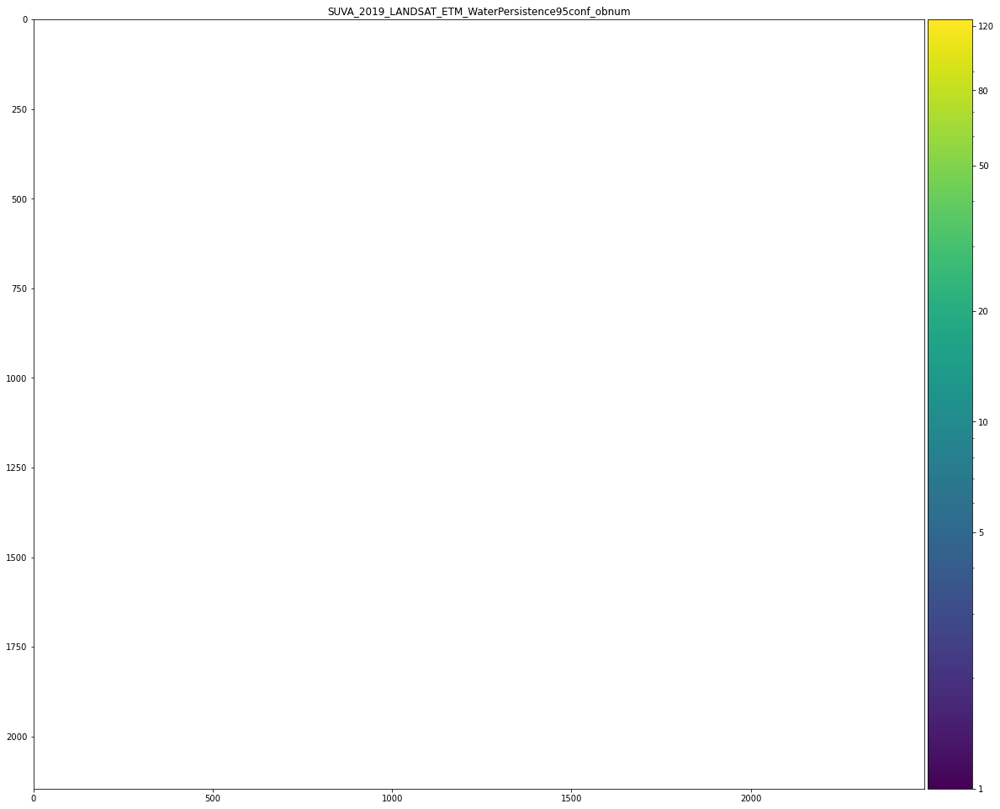

In [10]:
aoi_desc = 'SUVA'
measurements = ["watermask","waterprob"]

resolution = (-10,10)
output_crs = "EPSG:3460"

scenarios = ['WaterPersistence','WaterPersistence95conf']
for scen in scenarios[:]:

    prod_labs_list = ['SENTINEL_2','SENTINEL_1','LANDSAT_OLI','LANDSAT_ETM','ALL_SENSORS']
    prods_list = [["s2_water_mlclassification"],["s1_water_mlclassification"],["ls8_water_mlclassification"],["ls7_water_mlclassification"],["ls8_water_mlclassification","s1_water_mlclassification","s2_water_mlclassification","ls7_water_mlclassification"]]
    for products, prod_lab in zip(prods_list[3:4], prod_labs_list[3:4]):

        print("\n \n")
        print(prod_lab)
        wd = f'./WaterSummary_{aoi_desc}_{prod_lab}/'
        os.makedirs(wd, exist_ok=True)

#         t_bins = [("2019-01-01","2019-02-01"),("2019-02-01","2019-03-01"),("2019-03-01","2019-04-01"),("2019-04-01","2019-05-01"),("2019-05-01","2019-06-01"),("2019-06-01","2019-07-01"),("2019-07-01","2019-08-01"),("2019-08-01","2019-09-01"),("2019-09-01","2019-10-01"),("2019-10-01","2019-11-01"),("2019-11-01","2019-12-01"),("2019-12-01","2020-01-01")]
#         t_bin_labs = ["201901","201902","201903","201904","201905","201906","201907","201908","201909","201910","201911","201912"]
        t_bins = [(f"{i}-01-01", f"{i}-12-31") for i in (range(2019,2020))]
        t_bin_labs = [str(i) for i in range(2019,2020)]
        for t_bin, t_bin_lab in zip(t_bins[:], t_bin_labs[:]):
        
            print(t_bin, t_bin_lab)
            
            try:

                water_ds = load_water_ds(products, t_bin, latitude, longitude, output_crs, measurements, scen)
#                 persistence, num, mask = wfls(water_ds)
#                 plts(persistence, num, mask, aoi_desc, t_bin_lab, prod_lab, scen, wd)
            except Exception as e:                
                print(e)
                water_ds = load_water_ds(["ls7_water_mlclassification"], ('2001-01-01', '2001-12-31'), latitude, longitude, output_crs, measurements, scen)
                persistence, num, mask = wfls(water_ds)
                plts(persistence.where(persistence==-10), num.where(num==-10), mask, aoi_desc, t_bin_lab, prod_lab, scen, wd)

            water_ds = None
            persistence, num, mask = None, None, None
            water_pc_comp, water_no_comp, T0_water_comp = None, None, None

            gc.collect()

            print('')

In [1]:
print('b')

b


In [ ]:
print('boo')

In [1]:
print('ok')

ok


# **Lazy-load Water Masks & Delayed Processing**

# **Create GIF**

In [12]:
import imageio

In [13]:
image_paths = glob.glob('./*LANDSAT_OLI*.jpeg')[:]
g = './SUVA_2019_MONTHLY_LANDSAT_OLI_gif.gif'

with imageio.get_writer(g, mode='I', fps=10) as writer:
    for filename in tqdm(image_paths):
        image = imageio.imread(filename)
        writer.append_data(image)

100%|██████████| 12/12 [00:03<00:00,  3.11it/s]


# **OUT - Water Persistence - _pc**

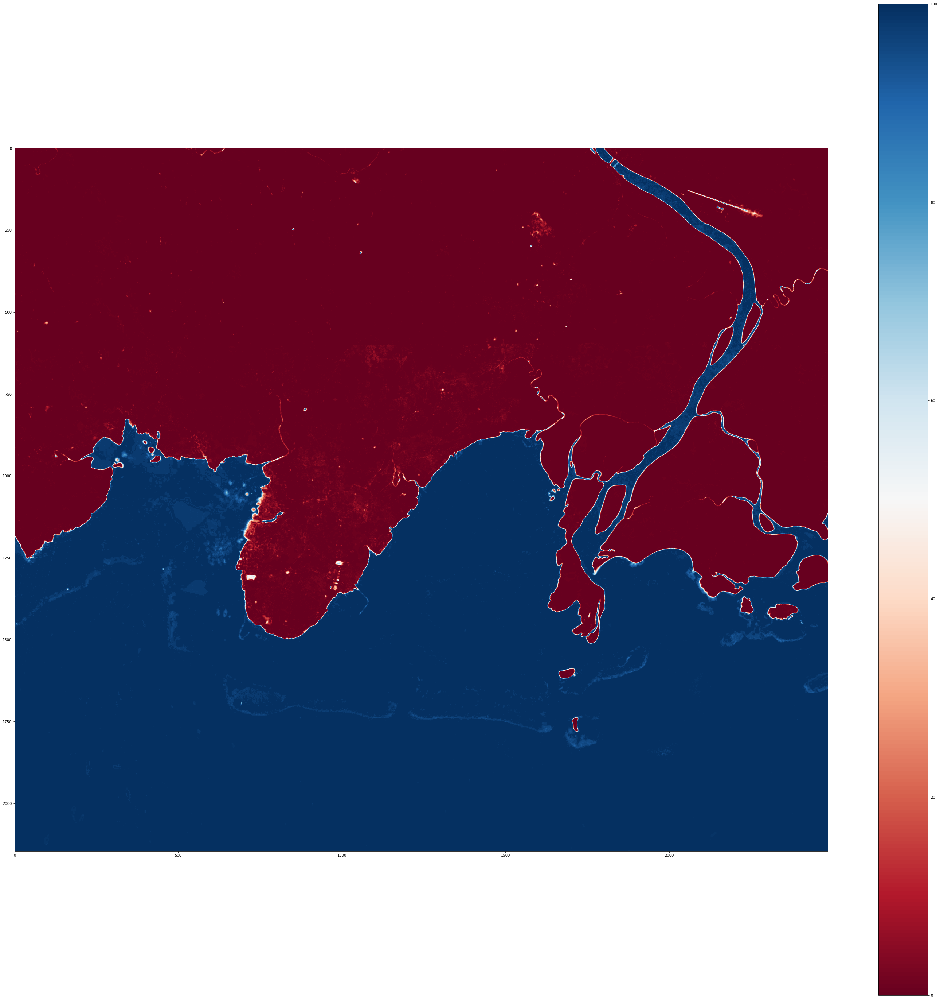

In [17]:
fig, ax = plt.subplots(figsize=(50,50))
im1 = ax.imshow(water_pc_comp.where(water_pc_comp!=-9999), cmap=matplotlib.cm.get_cmap('RdBu'))
fig.colorbar(im1, ax=ax,orientation='vertical')
fig.show()
fig.savefig('suva_2019_COMBINED_summaskthresh5.jpeg', bbox_inches='tight', pad_inches=0)

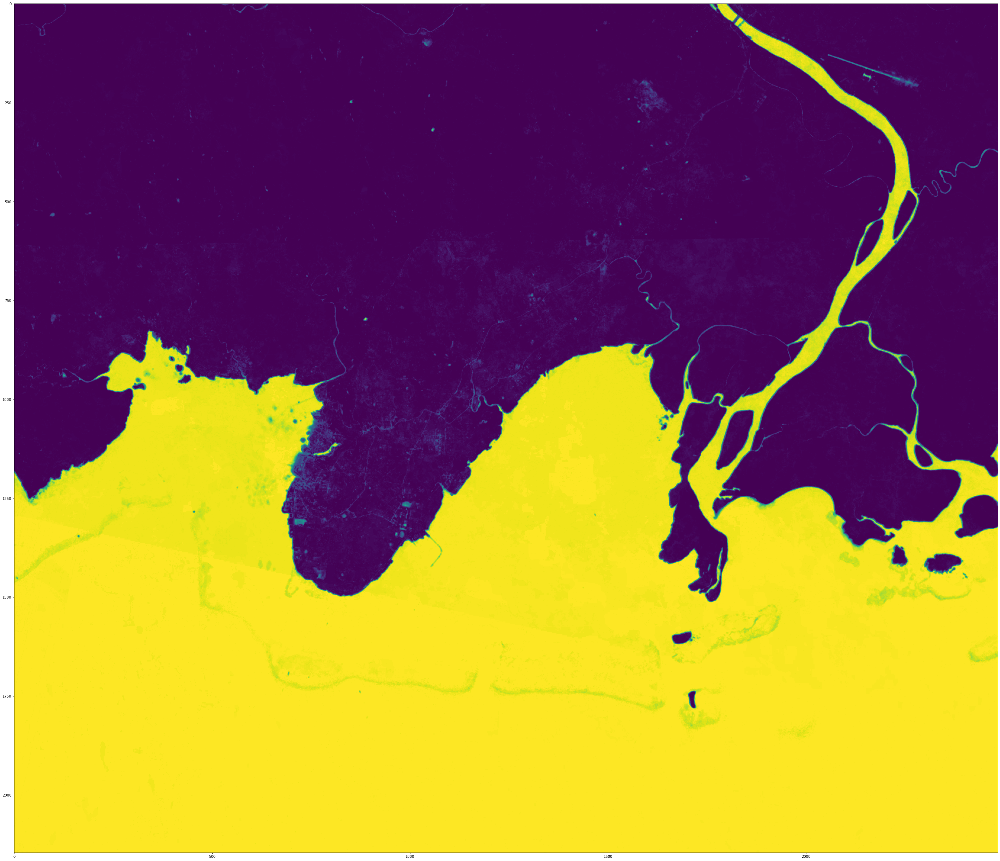

In [15]:
fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(water_pc_comp.where(water_pc_comp!=-9999))

# **OUT - Water Mask - _ma**
- not exported+indexed atm as can be done on the fly

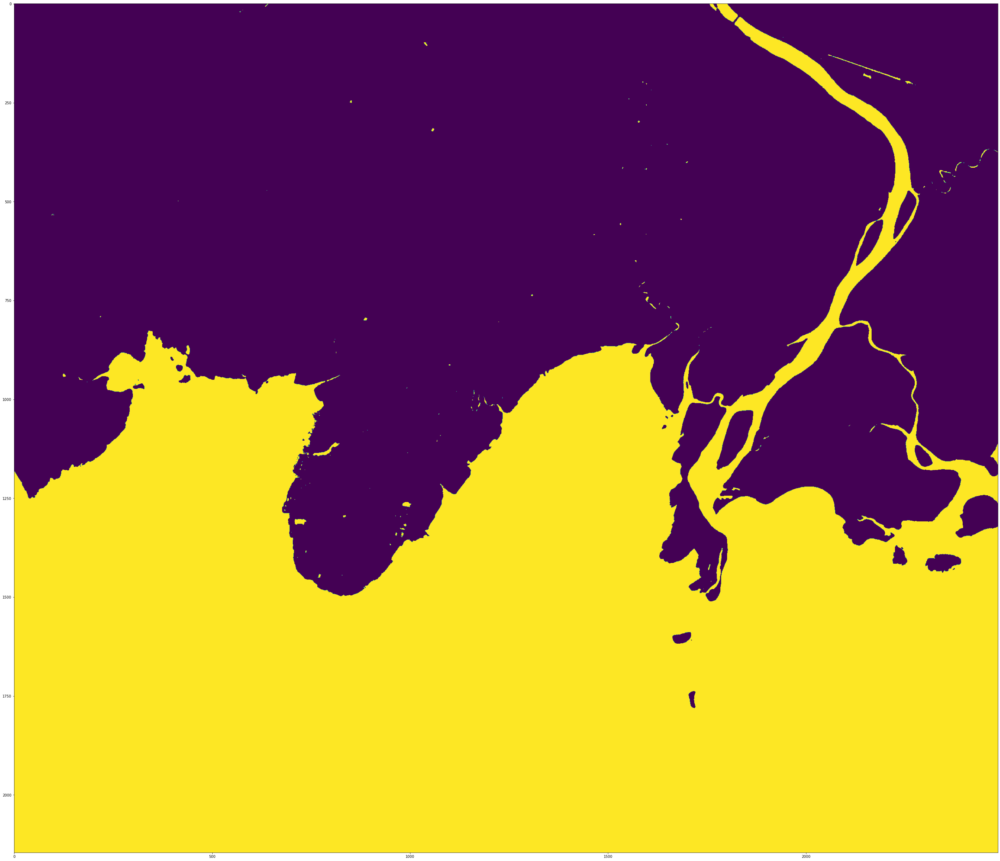

In [16]:
fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(T0_water_comp)

# **OUT - Number of Valid Observations - _no**

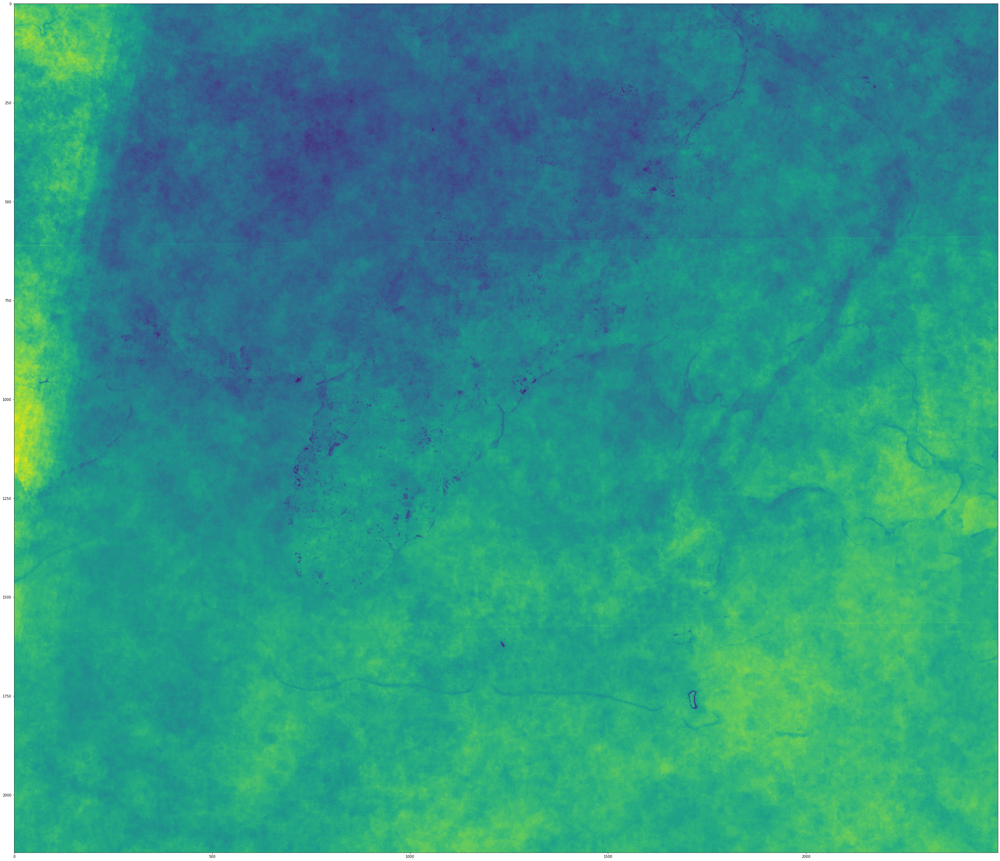

In [17]:
fig, ax = plt.subplots(figsize=(50,50))
ax.imshow(cnt_comp)

In [18]:
print('t')

t
